In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os

1. We use SIFT detector to find features of the image
2. Given two input images we use SIFT to get matching points.
3. In this way we obtain a set of points $x_1$ in Im 1 and corresponding $x_2$ in Im 2. For each pair we get a $p_i$

In [2]:
def get_display_matches_2(img1,img2, thresh = 0.75):
    # Initiate SIFT detector
#     sift = cv2.SIFT_create()
    sift = cv2.xfeatures2d.SIFT_create()
    # find the keypoints and descriptors with SIFT
    
    h,w,c = img1.shape
    kp=[]
    for i in range(1,h,10):
        for j in range(1,w,10):
            kp.append(cv2.KeyPoint(i, j, 3))
    
#     kp = cv2.UMat(np.array(kp))
#     kp1, des1 = sift.detectAndCompute(img1,kp)
    kp1, des1 = sift.compute(img1,kp)
#     kp2, des2 = sift.detectAndCompute(img2,kp)
    kp2, des2 = sift.compute(img2,kp)
    # BFMatcher with default params
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1,des2,k=2)
    # Apply ratio test
    good = []
    for m,n in matches:
        if m.distance < thresh*n.distance:
            good.append([m])
    good = np.array(good)
    src = np.float32([ kp1[m.queryIdx].pt for m in good[:,0] ]).reshape(-1,1,2)
    dst = np.float32([ kp2[m.trainIdx].pt for m in good[:,0] ]).reshape(-1,1,2)
    return src,dst

def get_display_matches(img1,img2, thresh=0.75):
    # Initiate SIFT detector
    sift = cv2.SIFT_create()
    # find the keypoints and descriptors with SIFT
    
    h,w,c = img1.shape
    
#     kp = cv2.UMat(np.array(kp))
    kp1, des1 = sift.detectAndCompute(img1,None)
#     kp1, des1 = sift.compute(img1,kp)
    kp2, des2 = sift.detectAndCompute(img2,None)
#     kp2, des2 = sift.compute(img2,kp)
    # BFMatcher with default params
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1,des2,k=2)
    # Apply ratio test
    good = []
    for m,n in matches:
        if m.distance < thresh*n.distance:
            good.append([m])
    good = np.array(good)
    src = np.float32([ kp1[m.queryIdx].pt for m in good[:,0] ]).reshape(-1,1,2)
    dst = np.float32([ kp2[m.trainIdx].pt for m in good[:,0] ]).reshape(-1,1,2)
    return src,dst

In this way we obtain a set of points $x_1$ in Im 1 and corresponding $x_2$ in Im 2. For each pair we get a $p_i$

$$p_i = \begin{bmatrix}
-x_i \quad -y_i \quad -1 \quad 0 \quad 0 \quad 0 \quad x_ix_i' \quad y_ix_i' \quad x_i' \\
0 \quad 0 \quad 0 \quad -x_i \quad -y_i \quad -1 \quad x_iy_i' \quad y_iy_i' \quad y_i'
\end{bmatrix}$$

$$x_1 = H_{12}x_2$$

We wish to estimate this $H_{12}$ which is the homography matrix. We need minimum 4 such $p_i$ to estimate H. 

With multiple sets of $p_i$'s, we try to robustly estimate $H$ using RANSAC approach.

In [3]:
def homography(x1_x2):
    matrix = []
    for cor in x1_x2:
        
        x1 = cor[0]
        x2 = cor[1]       
        
        row1 = [-x1[0],-x1[1],-1,0,0,0, x2[0] * x1[0], x2[0] * x1[1], x2[0] ]
        row2 = [0, 0, 0, -x1[0], -x1[1], -1, x2[1] *x1[0] , x2[1]*x1[1] , x2[1] ]

        matrix.append(row1)
        matrix.append(row2)
        
    matrix = np.array(matrix)
    u, s, Vh = np.linalg.svd(matrix)
    
    H = Vh[-1,:] / Vh[-1,-1]
    H = H.reshape((3,3))
    return H

def homography_error(p1,p2,H):
    p1 = np.array([p1[0],p1[1],1]).T
    p2 = np.array([p2[0],p2[1],1]).T
    
    proj_p1 = np.dot(H,p1)
    proj_p1 = proj_p1/proj_p1[2]
    
    return np.linalg.norm(p2-proj_p1) 


def RANSAC_cust(src,dst,inlier_thresh=10,num_iter=500):

    H_final = np.zeros((3,3))
    error_final = np.inf
    max_inliers = 0
    
    num_correspondence = len(src)
    
    for i in range(num_iter):
        
        num_points = np.random.choice(num_correspondence,4)
        x1_x2 = []
        for ii in num_points:
            x1_x2.append((src[ii,0,:], dst[ii,0,:] ))

        H = homography(x1_x2)
        inliers = 0
        
        for ii in range(num_correspondence):
            err = homography_error(src[ii,0,:], dst[ii,0,:] , H)
            
            if(err<inlier_thresh):
                inliers+=1
                
        if inliers>=max_inliers :
            max_inliers = inliers
            H_final = H
    return max_inliers, H_final

def get_homography(src,dst):
    
    inliers, H = RANSAC_cust(src, dst)
    return H


Utility

In [4]:
# Remove black region around the image after stitching
def remove_black(frame):
    
    if not np.sum(frame[0]):
        return remove_black(frame[1:])
    elif not np.sum(frame[-1]):
        return remove_black(frame[:-2])
    elif not np.sum(frame[:,0]):
        return remove_black(frame[:,1:]) 
    elif not np.sum(frame[:,-1]):
        return remove_black(frame[:,:-2])    
    return frame

def plottie_1d(n,images,strie):
    f, axarr = plt.subplots(1,n)
    f.set_figheight(5*1)
    f.set_figwidth(5*n)

    for j in range(n):
        
        axarr[j].imshow(images[j],cmap='gray')

        axarr[j].set_title(strie[j])

    plt.show()

# Image 1

AFTER STITCHING


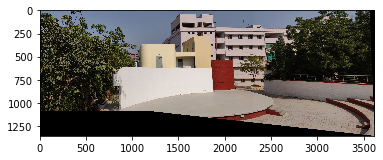

AFTER STITCHING


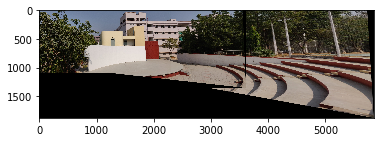

AFTER STITCHING


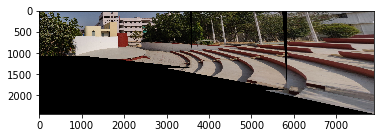

In [3]:
img1 = cv2.imread("../images/ImageMosaicing/1_1.jpg")
img1 = cv2.resize(img1,(img1.shape[1]//2,img1.shape[0]//2))
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread("../images/ImageMosaicing/1_2.jpg")
img2 = cv2.resize(img2,(img2.shape[1]//2,img2.shape[0]//2))
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

src,dst = get_display_matches(img1,img2)
H = get_homography(src,dst)

dst = cv2.warpPerspective(img2,np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]+img2.shape[0]))
dst[0:img1.shape[0], 0:img1.shape[1]] = img1
dst = remove_black(dst)
print("AFTER STITCHING")
plt.imshow(dst)
plt.show()

for i in range(3,5):
    pathie = "../images/ImageMosaicing/1_" + str(i) + ".jpg"
    img1 = dst
    img2 = cv2.imread(pathie)
    img2 = cv2.resize(img2,(img2.shape[1]//2,img2.shape[0]//2))
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
    src,dst = get_display_matches(img1,img2)
    H = get_homography(src,dst)
    dst = cv2.warpPerspective(img2,np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]+img2.shape[0]))
    dst[0:img1.shape[0], 0:img1.shape[1]] = img1
    dst = remove_black(dst)
    print("AFTER STITCHING")
    plt.imshow(dst)
    plt.show()

# Image 2

AFTER STITCHING 1st two images on top row


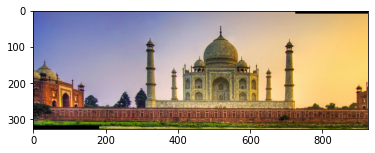

AFTER STITCHING the 3 images on top row


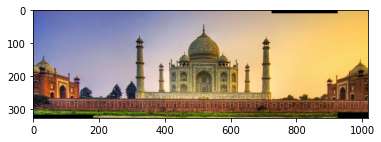

AFTER STITCHING 1st two images on bottom row


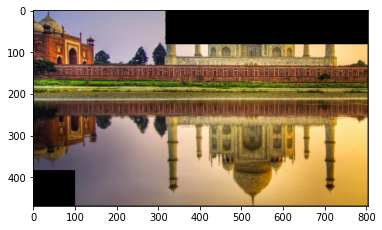

AFTER STITCHING the 3 images on bottom row


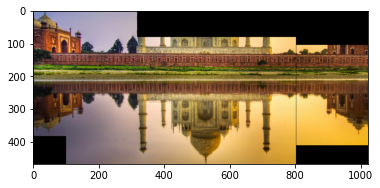

STITCHING the top and bottom row


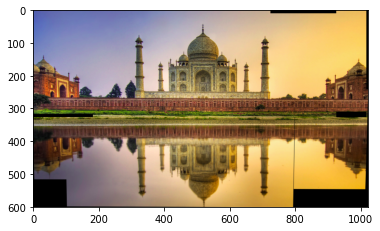

In [89]:
img1 = cv2.imread("../images/ImageMosaicing/2_1.png")
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread("../images/ImageMosaicing/2_2.png")
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

src,dst = get_display_matches(img1,img2)
H = get_homography(src,dst)

dst = cv2.warpPerspective(img2,np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]+img2.shape[0]))
dst[0:img1.shape[0], 0:img1.shape[1]] = img1
dst = remove_black(dst)
print("AFTER STITCHING 1st two images on top row")
plt.imshow(dst)
plt.show()

pathie = "../images/ImageMosaicing/2_" + str(3) + ".png"
img1 = dst
img2 = cv2.imread(pathie)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
src,dst = get_display_matches(img1,img2)
H = get_homography(src,dst)
dst = cv2.warpPerspective(img2,np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]+img2.shape[0]))
dst[0:img1.shape[0], 0:img1.shape[1]] = img1
dst1 = remove_black(dst)
print("AFTER STITCHING the 3 images on top row")
plt.imshow(dst1)
plt.show()





img1 = cv2.imread("../images/ImageMosaicing/2_4.png")
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread("../images/ImageMosaicing/2_5.png")
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

src,dst = get_display_matches(img1,img2)
H = get_homography(src,dst)

dst = cv2.warpPerspective(img2,np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]+img2.shape[0]))
dst[0:img1.shape[0], 0:img1.shape[1]] = img1
dst = remove_black(dst)
print("AFTER STITCHING 1st two images on bottom row")
plt.imshow(dst)
plt.show()

pathie = "../images/ImageMosaicing/2_" + str(6) + ".png"
img1 = dst
img2 = cv2.imread(pathie)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
src,dst = get_display_matches(img1,img2)
H = get_homography(src,dst)
dst = cv2.warpPerspective(img2,np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]+img2.shape[0]))
dst[0:img1.shape[0], 0:img1.shape[1]] = img1
dst2 = remove_black(dst)
print("AFTER STITCHING the 3 images on bottom row")
plt.imshow(dst2)
plt.show()



src,dst = get_display_matches(dst1,dst2)
H = get_homography(src,dst)
dst = cv2.warpPerspective(dst2,np.linalg.inv(H),(dst1.shape[1] + dst2.shape[1], dst1.shape[0]+dst2.shape[0]))
dst[0:dst1.shape[0], 0:dst1.shape[1]] = dst1
dst = remove_black(dst)
print("STITCHING the top and bottom row")
plt.imshow(dst)
plt.show()

# Image 3

AFTER STITCHING


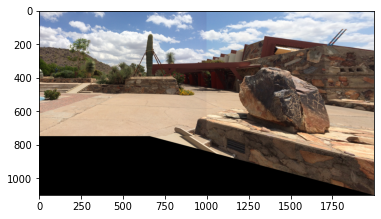

In [90]:
img1 = cv2.imread("../images/ImageMosaicing/3_1.png")
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread("../images/ImageMosaicing/3_2.png")
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

src,dst = get_display_matches(img1,img2)
H = get_homography(src,dst)

dst = cv2.warpPerspective(img2,np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]+img2.shape[0]))
dst[0:img1.shape[0], 0:img1.shape[1]] = img1
dst = remove_black(dst)
print("AFTER STITCHING")
plt.imshow(dst)
plt.show()

# Image 4

AFTER STITCHING


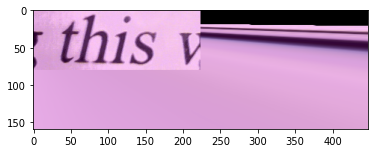

This is because there are not enough overlapping points between the two images


In [92]:
img1 = cv2.imread("../images/ImageMosaicing/4_1.jpg")
img1 = cv2.resize(img1,(img1.shape[1]//2,img1.shape[0]//2))
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread("../images/ImageMosaicing/4_2.jpg")
img2 = cv2.resize(img2,(img2.shape[1]//2,img2.shape[0]//2))
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

src,dst = get_display_matches(img1,img2)
H = get_homography(src,dst)

dst = cv2.warpPerspective(img2,np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]+img2.shape[0]))
dst[0:img1.shape[0], 0:img1.shape[1]] = img1
dst = remove_black(dst)
print("AFTER STITCHING")
plt.imshow(dst)
plt.show()
print("This is because there are not enough overlapping points between the two images")

# Image 5

(2176, 4608, 3)
AFTER STITCHING top row


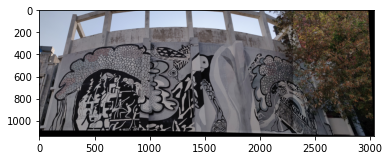

(2176, 4608, 3)
AFTER STITCHING bottom row


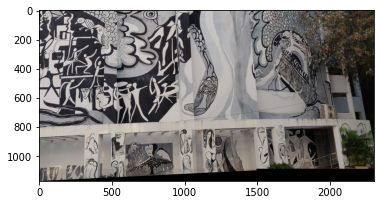

STITCHING the top and bottom row


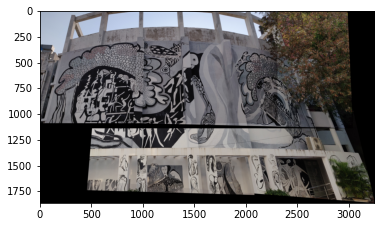

In [94]:
img1 = cv2.imread("../images/ImageMosaicing/5_1.jpg")
print(img1.shape)
img1 = cv2.resize(img1,(img1.shape[1]//2,img1.shape[0]//2))
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread("../images/ImageMosaicing/5_2.jpg")
img2 = cv2.resize(img2,(img2.shape[1]//2,img2.shape[0]//2))
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

src,dst = get_display_matches(img1,img2)
H = get_homography(src,dst)

dst = cv2.warpPerspective(img2,np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]+img2.shape[0]))
dst[0:img1.shape[0], 0:img1.shape[1]] = img1
dst1 = remove_black(dst)
print("AFTER STITCHING top row")
plt.imshow(dst1)
plt.show()



img1 = cv2.imread("../images/ImageMosaicing/5_3.jpg")
print(img1.shape)
img1 = cv2.resize(img1,(img1.shape[1]//2,img1.shape[0]//2))
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread("../images/ImageMosaicing/5_4.jpg")
img2 = cv2.resize(img2,(img2.shape[1]//2,img2.shape[0]//2))
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

src,dst = get_display_matches(img1,img2)
H = get_homography(src,dst)

dst = cv2.warpPerspective(img2,np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]+img2.shape[0]))
dst[0:img1.shape[0], 0:img1.shape[1]] = img1
dst2 = remove_black(dst)
print("AFTER STITCHING bottom row")
plt.imshow(dst2)
plt.show()

src,dst = get_display_matches(dst1,dst2)
H = get_homography(src,dst)

dst = cv2.warpPerspective(dst2,np.linalg.inv(H),(dst1.shape[1] + dst2.shape[1], dst1.shape[0]+dst2.shape[0]))
dst[0:dst1.shape[0], 0:dst1.shape[1]] = dst1
dst = remove_black(dst)
print("STITCHING the top and bottom row")
plt.imshow(dst)
plt.show()

# CUSTOM IMAGE (IMAGE 6)

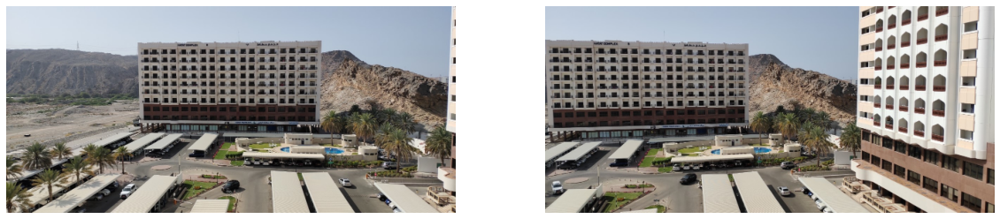

OUTPUT


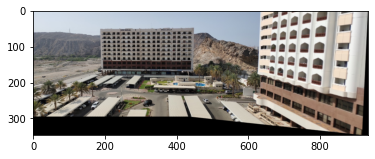

In [98]:
img1 = cv2.imread("../images/ImageMosaicing/6_2.jpg")
img1 = cv2.resize(img1,(img1.shape[1]//2,img1.shape[0]//2))
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread("../images/ImageMosaicing/6_1.jpg")
img2 = cv2.resize(img2,(img2.shape[1]//2,img2.shape[0]//2))
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
plt.figure(figsize = [20,40])
plt.subplot(221)
plt.imshow(img1)
plt.axis('off')
plt.subplot(222)
plt.imshow(img2)
plt.axis('off')
plt.show()
src,dst = get_display_matches(img1,img2)
H = get_homography(src,dst)



dst = cv2.warpPerspective(img2,np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]+img2.shape[0]))
dst[0:img1.shape[0], 0:img1.shape[1]] = img1
dst = remove_black(dst)
print("OUTPUT")
plt.imshow(dst)
plt.show()

# BONUS
We take in a list and stitch images having top number of correspondences recursively. 

In [6]:
def stitch_multiple_images(img_listie):
    
    num_imgs = len(img_listie)
    if num_imgs == 1:
        return img_listie[0]
    
    max_match = 0
    final_1 = 0
    final_2 = 0
    for img1_indie in range(num_imgs):
        for img2_indie in range(num_imgs):
            if img1_indie != img2_indie:
                img1 = img_listie[img1_indie]
                img2 = img_listie[img2_indie]
                src,dst = get_display_matches(img1,img2)
                if len(src) > max_match:
                    max_match = len(src)
                    final_1 = img1_indie
                    final_2 = img2_indie
    
    print(final_1, final_2)
    img1 = img_listie[final_2]
    img2 = img_listie[final_1]
    src,dst = get_display_matches(img1, img2)
    H = get_homography(src,dst)

    dst = cv2.warpPerspective(img2,np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]+img2.shape[0]))
    dst[0:img1.shape[0], 0:img1.shape[1]] = img1
    dst = remove_black(dst)
    print("OUTPUT")
    plt.imshow(dst)
    plt.show()
    
    for_next = [dst]
    for i in range(num_imgs):
        if i!=final_1 and i!= final_2:
            for_next.append(img_listie[i])
    print(len(for_next))
    stitch_multiple_images(for_next)

2 1
OUTPUT


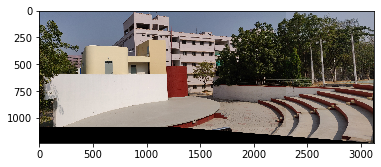

2
0 1
OUTPUT


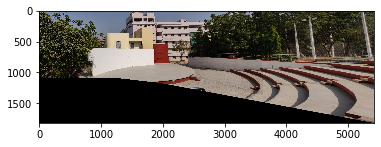

1


In [25]:
img1 = cv2.imread("../images/ImageMosaicing/1_1.jpg")
img1 = cv2.resize(img1,(img1.shape[1]//2,img1.shape[0]//2))
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

img2 = cv2.imread("../images/ImageMosaicing/1_2.jpg")
img2 = cv2.resize(img2,(img2.shape[1]//2,img2.shape[0]//2))
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

img3 = cv2.imread("../images/ImageMosaicing/1_3.jpg")
img3 = cv2.resize(img3,(img3.shape[1]//2,img3.shape[0]//2))
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

stitch_multiple_images([img1, img2, img3])

# Question 2.1

We perform intensity patch-match between two images via brute force.
It tries to find best-matching patch for image 1 by checking the match between normalised patches

In [8]:
def draw_matches(img1,img2,matches,ws=0):
    r,c,_ = img1.shape
    img3 = np.zeros((r,2*c,3))
    img3[:,:c,:] = img1
    img3[:,c:,:] = img2
    
    for match in matches:
        color = tuple(np.random.randint(0,255,3).tolist())
        p = (match[0][1]+ws//2,match[0][0]+ws//2)
        q = (match[1][1]+c+ws//2,match[1][0]+ws//2)
        lined = cv2.line(img3,p,q,color,2)
        lined = cv2.circle(lined,p,5,color,-1)
        lined = cv2.circle(lined,q,5,color,-1)
    plt.figure(figsize=(18,18))
    
    plt.imshow(lined.astype(np.uint8))
    plt.axis('off')
    plt.show()
    
def normcorr(a,b):
    na = (a-np.mean(a))/(np.linalg.norm(a-np.mean(a)))
    nb = (b-np.mean(b))/(np.linalg.norm(b-np.mean(b)))    
    return np.sum(abs(na*nb))

In [9]:
def lin_filter(img1, img2, k=32,step=32,offie=0):

    m1,n1,_ = img1.shape
    m2,n2,_ = img2.shape
    final_matches = []

    for i1 in range(k//2,m1-(k//2),step): 

        for j1 in range(k//2,n1-(k//2),step): 

            row_right1 = j1 + k//2 + 1
            row_left1 = j1 - k//2
            column_bottom1 = i1+k//2+1
            column_top1 = i1 - k//2
            img_slice1= img1[column_top1:column_bottom1,row_left1:row_right1]
            best_corr = -1
            
            for i2 in range(k//2,m2-(k//2),step): 

                for j2 in range(k//2,n2-(k//2),step): 

                    row_right2 = j2 + k//2 + 1
                    row_left2 = j2 - k//2
                    column_bottom2 = i2+k//2+1
                    column_top2 = i2 - k//2
                    img_slice2 = img2[column_top2:column_bottom2,row_left2:row_right2]
                    
                    corr = normcorr(img_slice1,img_slice2)
                    if corr>best_corr:
                        best_corr = corr
                        best_match = np.array([[i1,j1+offie],[i2,j2+offie],corr])

            final_matches.append(best_match)

    return final_matches

Outputs of brute force patch matching for some corner cases

<ipython-input-130-d66f15ac00ab>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  best_match = np.array([[i1,j1+offie],[i2,j2+offie],corr])


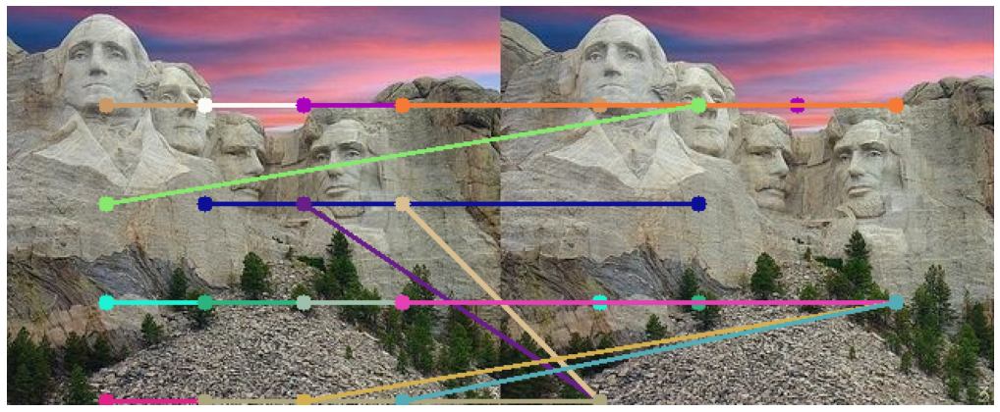

In [131]:
img1 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/1_1.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/1_2.jpg'),cv2.COLOR_BGR2RGB)
matches = lin_filter(img1,img2,64,64)
lined_im = draw_matches(img1,img2,matches,64)

<ipython-input-118-d66f15ac00ab>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  best_match = np.array([[i1,j1+offie],[i2,j2+offie],corr])


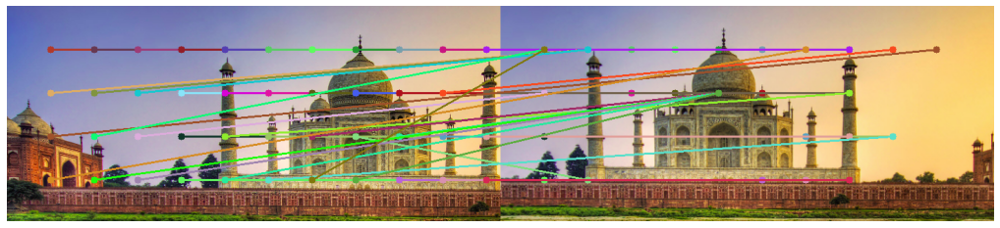

In [127]:
img1 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/2_1.png'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/2_2.png'),cv2.COLOR_BGR2RGB)
img2 = cv2.resize(img2,(img1.shape[1],img1.shape[0]))
matches = lin_filter(img1,img2,64,64)
lined_im = draw_matches(img1,img2,matches,64)

<ipython-input-118-d66f15ac00ab>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  best_match = np.array([[i1,j1+offie],[i2,j2+offie],corr])
<ipython-input-117-f2052668499e>:39: RuntimeWarning: invalid value encountered in true_divide
  nb = (b-np.mean(b))/(np.linalg.norm(b-np.mean(b)))
<ipython-input-117-f2052668499e>:38: RuntimeWarning: invalid value encountered in true_divide
  na = (a-np.mean(a))/(np.linalg.norm(a-np.mean(a)))


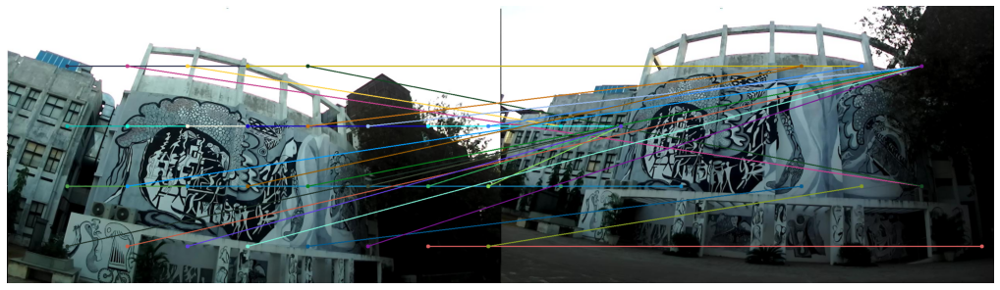

In [128]:
img1 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/3_1.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/3_2.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.resize(img2,(img1.shape[1],img1.shape[0]))
matches = lin_filter(img1,img2,156,156)
lined_im = draw_matches(img1,img2,matches,156)

# Question 2.2 (Plotting Epipolar lines)

All points $x_1$ in image 1 have a corresponding line $l_2$ in image two which is the epipolar line. 

We estimate fundamental matrix such that $$x_2^{T} F x_1 = 0$$
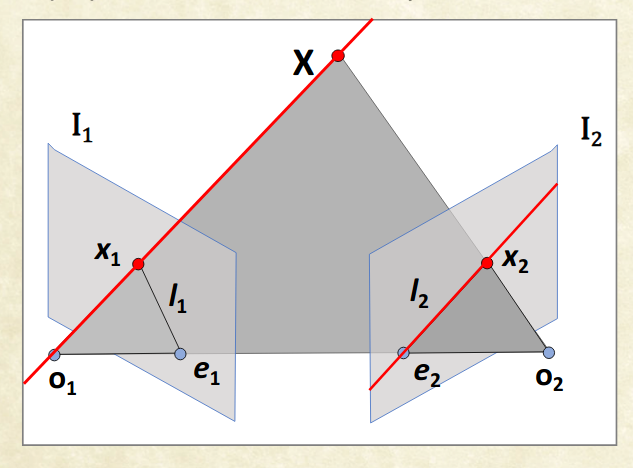


In [12]:
def get_fun(pts1,pts2): 
    F, mask = cv2.findFundamentalMat(pts1,pts2,cv2.RANSAC)
    pts1 = pts1[mask.ravel()==1]
    pts2 = pts2[mask.ravel()==1]
    
    return pts1,pts2,F

def compute_epipolar_lines(pt, img, F):

    _,N = pt.shape
    if img==1:
        line = F @ pt
    else:
        line = (F.T)@ pt

    return normalise_lines(line,N)

def normalise_lines(mat,N):
    norm = np.zeros((1,N))
    s = mat.copy()
    norm = np.sum((mat[:2,:])**2, axis = 0)
    mat = mat/(np.tile(norm, (3, 1)))
    return mat

def drawlines(img11,img21,lines,pts1,pts2):
    r,c,_ = img11.shape
    pts1 = np.squeeze(pts1,axis=1)
    pts2 = np.squeeze(pts2,axis=1)
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1temp = cv2.line(img11, (x0,y0), (x1,y1), color,1)
        img1temp = cv2.circle(img11,tuple(pt1),5,color,-1)
        img2temp = cv2.circle(img21,tuple(pt2),5,color,-1)
        
    return img1temp,img2temp


EPIPOLAR LINES FOR IMAGE 1


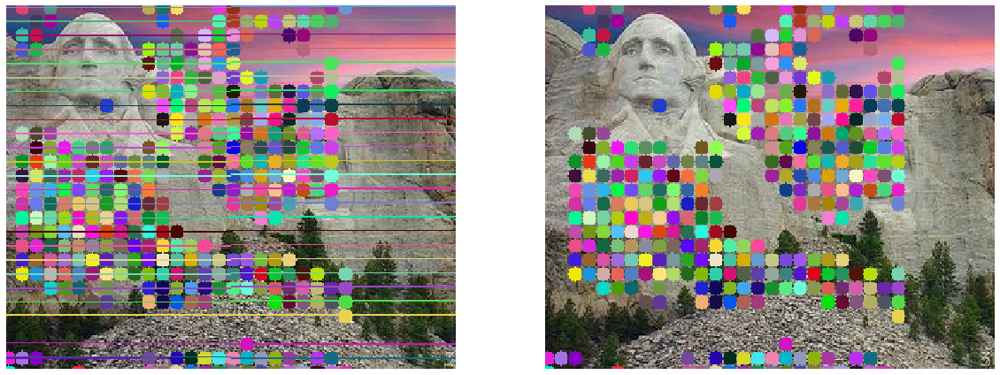

EPIPOLAR LINES FOR IMAGE 2


(-0.5, 319.5, 258.5, -0.5)

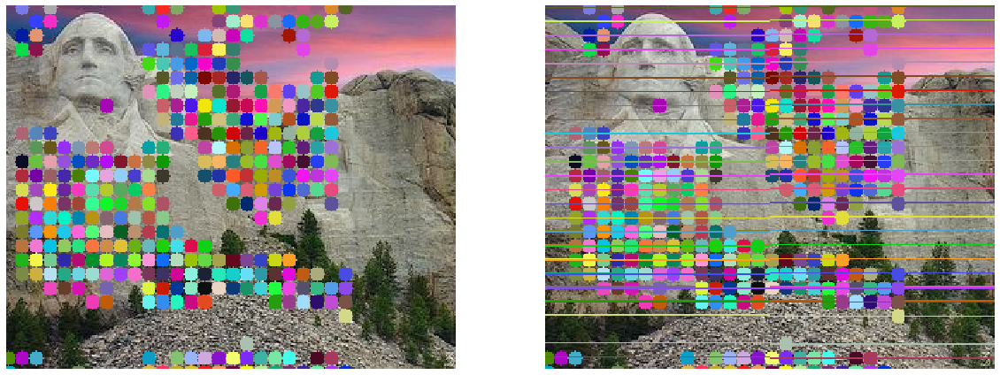

In [32]:
img1 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/1_1.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/1_2.jpg'),cv2.COLOR_BGR2RGB)

src,dst = get_display_matches_2(img1,img2)
pts1, pts2, F = get_fun(src,dst)

pts1_hom = cv2.convertPointsToHomogeneous(pts1)
pts2_hom = cv2.convertPointsToHomogeneous(pts2)


pts1_hom = np.squeeze(pts1_hom,axis=1).T
pts2_hom = np.squeeze(pts2_hom,axis=1).T


lines1 = compute_epipolar_lines(pts2_hom, 2,F) 
img5,img6 = drawlines(img1,img2,lines1.T,pts1,pts2) 
plt.figure(figsize = [20,40])
print("EPIPOLAR LINES FOR IMAGE 1")
plt.subplot(221)
plt.imshow(img5)
plt.axis('off')
plt.subplot(222)
plt.imshow(img6)
plt.axis('off')
plt.show()

img1 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/1_1.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/1_2.jpg'),cv2.COLOR_BGR2RGB)

lines2 = compute_epipolar_lines(pts1_hom, 1,F) 
print("EPIPOLAR LINES FOR IMAGE 2")
img3,img4 = drawlines(img2,img1,lines2.T,pts2,pts1)
plt.figure(figsize = [20,40])
plt.subplot(221)
plt.imshow(img4)
plt.axis('off')
plt.subplot(222)
plt.imshow(img3)
plt.axis('off')

EPIPOLAR LINES FOR IMAGE 1


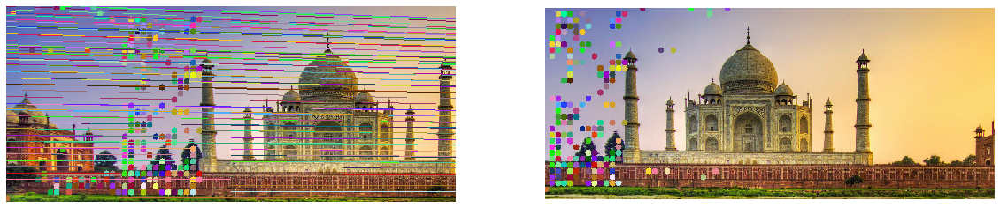

EPIPOLAR LINES FOR IMAGE 2


(-0.5, 742.5, 317.5, -0.5)

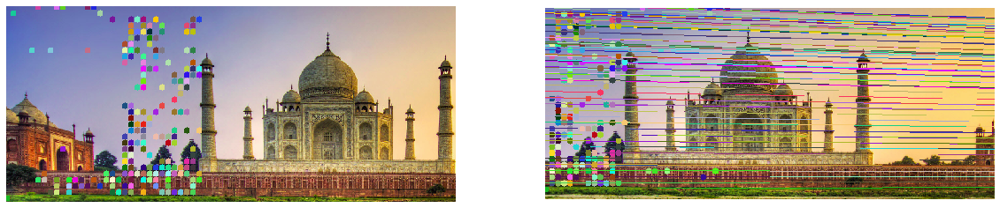

In [43]:
img1 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/2_1.png'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/2_2.png'),cv2.COLOR_BGR2RGB)

src,dst = get_display_matches_2(img1,img2, 0.92)
pts1, pts2, F = get_fun(src,dst)

pts1_hom = cv2.convertPointsToHomogeneous(pts1)
pts2_hom = cv2.convertPointsToHomogeneous(pts2)


pts1_hom = np.squeeze(pts1_hom,axis=1).T
pts2_hom = np.squeeze(pts2_hom,axis=1).T


lines1 = compute_epipolar_lines(pts2_hom, 2,F) 
img5,img6 = drawlines(img1,img2,lines1.T,pts1,pts2)
plt.figure(figsize = [20,40])
print("EPIPOLAR LINES FOR IMAGE 1")
plt.subplot(221)
plt.imshow(img5)
plt.axis('off')
plt.subplot(222)
plt.imshow(img6)
plt.axis('off')
plt.show()

img1 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/2_1.png'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/2_2.png'),cv2.COLOR_BGR2RGB)

lines2 = compute_epipolar_lines(pts1_hom, 1,F) 

print("EPIPOLAR LINES FOR IMAGE 2")
img3,img4 = drawlines(img2,img1,lines2.T,pts2,pts1)
plt.figure(figsize = [20,40])
plt.subplot(221)
plt.imshow(img4)
plt.axis('off')
plt.subplot(222)
plt.imshow(img3)
plt.axis('off')

EPIPOLAR LINES FOR IMAGE 1


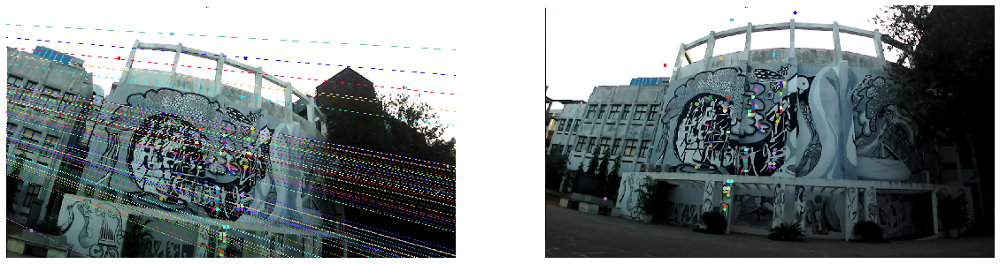

EPIPOLAR LINES FOR IMAGE 2


(-0.5, 1279.5, 719.5, -0.5)

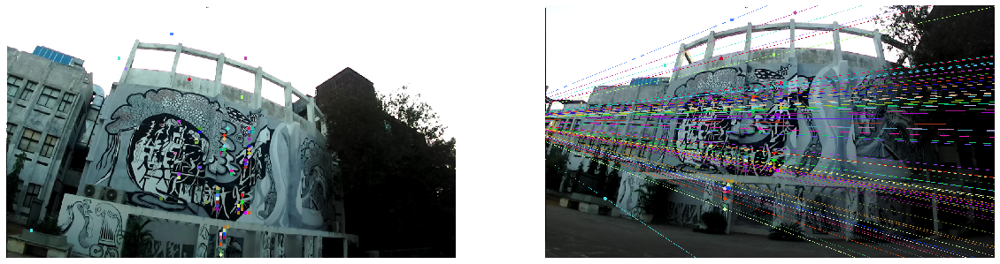

In [44]:
img1 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/3_1.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/3_2.jpg'),cv2.COLOR_BGR2RGB)

src,dst = get_display_matches_2(img1,img2)
pts1, pts2, F = get_fun(src,dst)

pts1_hom = cv2.convertPointsToHomogeneous(pts1)
pts2_hom = cv2.convertPointsToHomogeneous(pts2)


pts1_hom = np.squeeze(pts1_hom,axis=1).T
pts2_hom = np.squeeze(pts2_hom,axis=1).T


lines1 = compute_epipolar_lines(pts2_hom, 2,F) 
img5,img6 = drawlines(img1,img2,lines1.T,pts1,pts2) 
plt.figure(figsize = [20,40])
print("EPIPOLAR LINES FOR IMAGE 1")
plt.subplot(221)
plt.imshow(img5)
plt.axis('off')
plt.subplot(222)
plt.imshow(img6)
plt.axis('off')
plt.show()

img1 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/3_1.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/3_2.jpg'),cv2.COLOR_BGR2RGB)

lines2 = compute_epipolar_lines(pts1_hom, 1,F) 
print("EPIPOLAR LINES FOR IMAGE 2")
img3,img4 = drawlines(img2,img1,lines2.T,pts2,pts1)
plt.figure(figsize = [20,40])
plt.subplot(221)
plt.imshow(img4)
plt.axis('off')
plt.subplot(222)
plt.imshow(img3)
plt.axis('off')

# Question 2.3

Greedy implementation: Post stereo rectification we know that matches will be in corresponding rows only. Greedy takes advantage of this fact to make the best match

In [15]:
def greedy_stereo(img1, img2, window_size = 64, stridex = 64, stridey = 64):

    h1,w1,_ = img1.shape
    h2,w2,_ = img2.shape

    best_matches = []
    for y1 in range(0,h1-window_size+1,stridey):
        for x1 in range(0,w1-window_size+1,stridex):
            least_dis = -np.inf
            v1 = img1[y1:y1+window_size, x1:x1+window_size,:].flatten()
            for x2 in range(0,w2-window_size+1,stridex):
                v2 = img2[y1:y1+window_size, x2:x2+window_size,:].flatten()
                dis = normcorr(v1,v2)
                if dis>least_dis:
                    least_dis = dis
                    least_coord = np.array([[y1,x1],[y1,x2],dis])
            best_matches.append(least_coord)
    return best_matches

RECTIFIED IMAGES


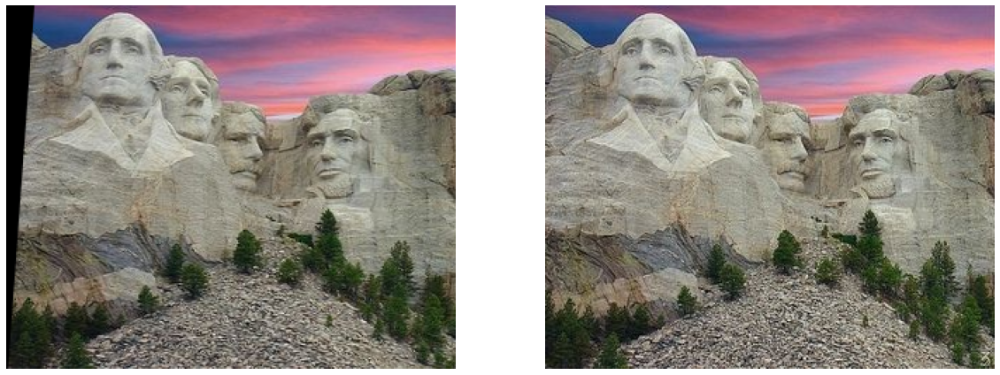

<ipython-input-9-d66f15ac00ab>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  best_match = np.array([[i1,j1+offie],[i2,j2+offie],corr])


Brute Force on Stereo Rectified


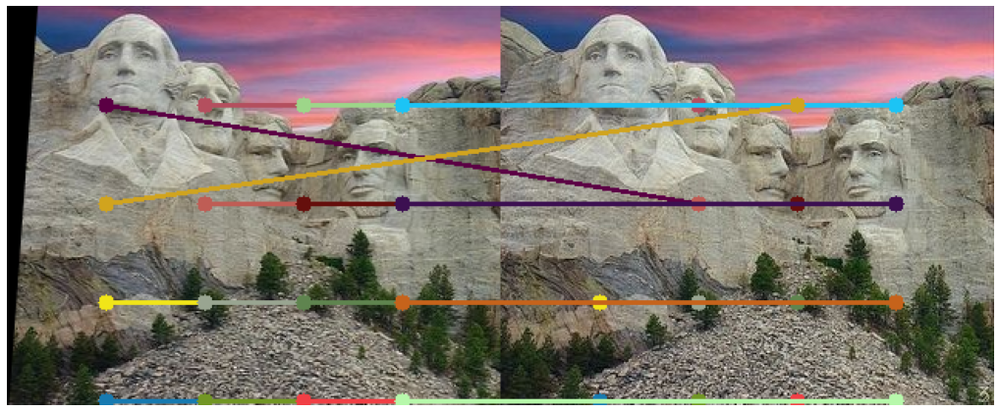

Greedy on Stereo Rectified


<ipython-input-15-489d929c616c>:16: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  least_coord = np.array([[y1,x1],[y1,x2],dis])


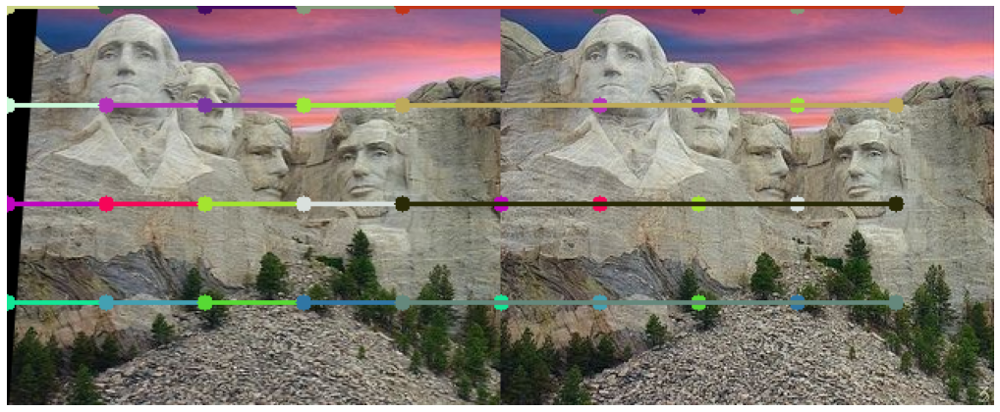

In [18]:
img1 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/1_1.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/1_2.jpg'),cv2.COLOR_BGR2RGB)

src,dst = get_display_matches_2(img1,img2)
pts1, pts2, F = get_fun(src,dst)

img_size = img1.shape[0:2][::-1]
p,H1,H2=cv2.stereoRectifyUncalibrated(src,dst, F, img_size)

        
img1_corrected = cv2.warpPerspective(img1, H1, img_size)
img2_corrected = cv2.warpPerspective(img2, H2, img_size)

print("RECTIFIED IMAGES")
# img3,img4 = drawlines(img2,img1,lines2.T,pts2,pts1)
plt.figure(figsize = [20,40])
plt.subplot(221)
plt.imshow(img1_corrected)
plt.axis('off')
plt.subplot(222)
plt.imshow(img2_corrected)
plt.axis('off')
plt.show()
matches = lin_filter(img1_corrected,img2_corrected,64,64)
print("Brute Force on Stereo Rectified")
lined_im = draw_matches(img1_corrected,img2_corrected,matches,64)

print("Greedy on Stereo Rectified")
matches = greedy_stereo(img1_corrected, img2_corrected)
lined_im = draw_matches(img1_corrected,img2_corrected,matches)

RECTIFIED IMAGES


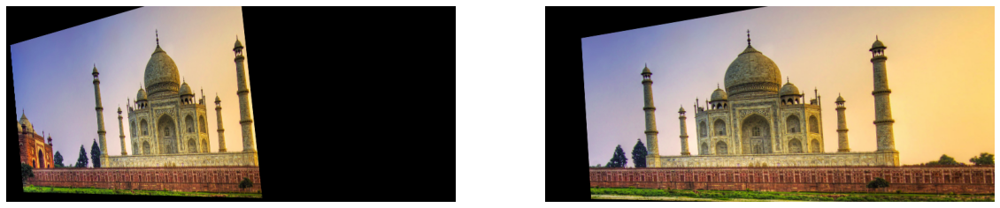

Brute Force on Stereo Rectified


<ipython-input-9-d66f15ac00ab>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  best_match = np.array([[i1,j1+offie],[i2,j2+offie],corr])
<ipython-input-8-09fdce508897>:22: RuntimeWarning: invalid value encountered in true_divide
  nb = (b-np.mean(b))/(np.linalg.norm(b-np.mean(b)))
<ipython-input-8-09fdce508897>:21: RuntimeWarning: invalid value encountered in true_divide
  na = (a-np.mean(a))/(np.linalg.norm(a-np.mean(a)))


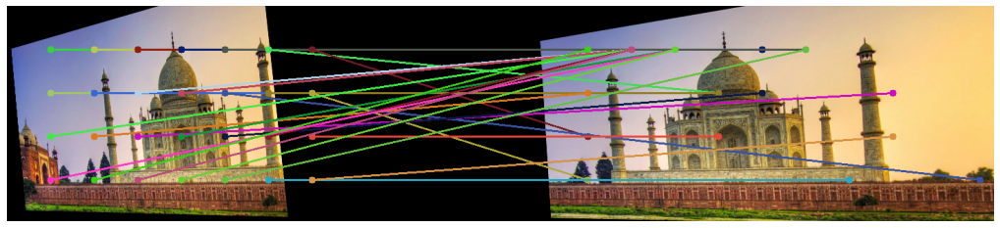

Greedy on Stereo Rectified


<ipython-input-15-489d929c616c>:16: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  least_coord = np.array([[y1,x1],[y1,x2],dis])


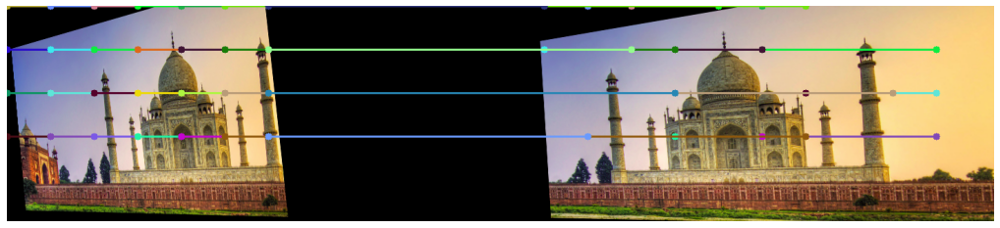

In [19]:
img1 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/2_1.png'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/2_2.png'),cv2.COLOR_BGR2RGB)

src,dst = get_display_matches_2(img1,img2, 0.79)
pts1, pts2, F = get_fun(src,dst)

img_size = img1.shape[0:2][::-1]
p,H1,H2=cv2.stereoRectifyUncalibrated(src,dst, F, img_size)

        
img1_corrected = cv2.warpPerspective(img1, H1, img_size)
img2_corrected = cv2.warpPerspective(img2, H2, img_size)

print("RECTIFIED IMAGES")
# img3,img4 = drawlines(img2,img1,lines2.T,pts2,pts1)
plt.figure(figsize = [20,40])
plt.subplot(221)
plt.imshow(img1_corrected)
plt.axis('off')
plt.subplot(222)
plt.imshow(img2_corrected)
plt.axis('off')
plt.show()
print("Brute Force on Stereo Rectified")
matches = lin_filter(img1_corrected,img2_corrected,64,64)
lined_im = draw_matches(img1_corrected,img2_corrected,matches,64)
print("Greedy on Stereo Rectified")
matches = greedy_stereo(img1_corrected, img2_corrected)
lined_im = draw_matches(img1_corrected,img2_corrected,matches)

RECTIFIED IMAGES


<ipython-input-8-09fdce508897>:22: RuntimeWarning: invalid value encountered in true_divide
  nb = (b-np.mean(b))/(np.linalg.norm(b-np.mean(b)))
<ipython-input-9-d66f15ac00ab>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  best_match = np.array([[i1,j1+offie],[i2,j2+offie],corr])


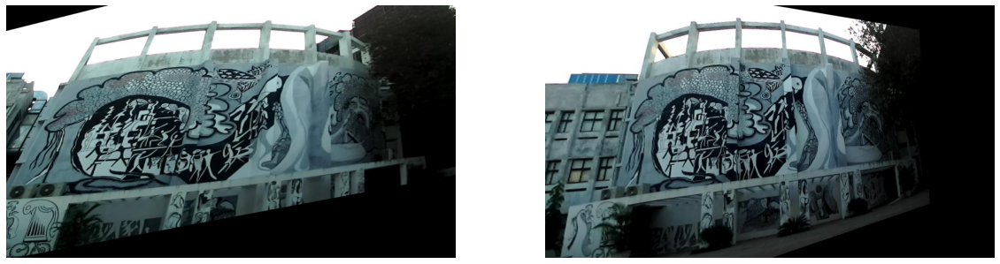

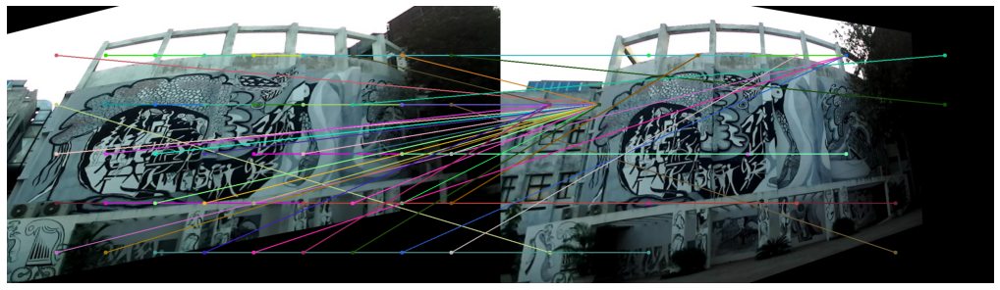

<ipython-input-15-489d929c616c>:16: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  least_coord = np.array([[y1,x1],[y1,x2],dis])
<ipython-input-8-09fdce508897>:21: RuntimeWarning: invalid value encountered in true_divide
  na = (a-np.mean(a))/(np.linalg.norm(a-np.mean(a)))


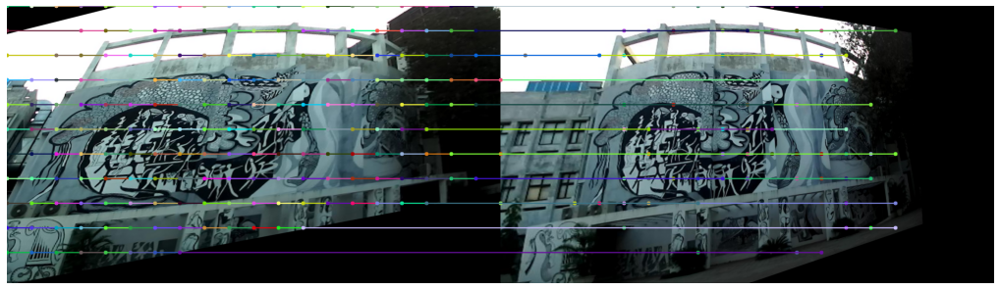

In [20]:
img1 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/3_1.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/3_2.jpg'),cv2.COLOR_BGR2RGB)

src,dst = get_display_matches_2(img1,img2, 0.7701)
pts1, pts2, F = get_fun(src,dst)

img_size = img1.shape[0:2][::-1]
p,H1,H2=cv2.stereoRectifyUncalibrated(src,dst, F, img_size)

        
img1_corrected = cv2.warpPerspective(img1, H1, img_size)
img2_corrected = cv2.warpPerspective(img2, H2, img_size)

print("RECTIFIED IMAGES")
# img3,img4 = drawlines(img2,img1,lines2.T,pts2,pts1)
plt.figure(figsize = [20,40])
plt.subplot(221)
plt.imshow(img1_corrected)
plt.axis('off')
plt.subplot(222)
plt.imshow(img2_corrected)
plt.axis('off')

matches = lin_filter(img1_corrected,img2_corrected,128,128)
lined_im = draw_matches(img1_corrected,img2_corrected,matches,128)

matches = greedy_stereo(img1_corrected, img2_corrected)
lined_im = draw_matches(img1_corrected,img2_corrected,matches)

# BONUS

SIFT performs much better than intenisty matching

In [128]:
def get_sift_matches_plot(img1, img2, thresh=0.75):
    src, dst = get_display_matches_2(img1, img2, thresh)
    matches = []
    for ind in range(src.shape[0]):
        x1 = int(src[ind][0][0])
        y1 = int(src[ind][0][1])
        x2 = int(dst[ind][0][0])
        y2 = int(dst[ind][0][1])
        best_match = np.array([[y1,x1],[y2,x2],0])
        matches.append(best_match)
    return matches

Intensity Matching


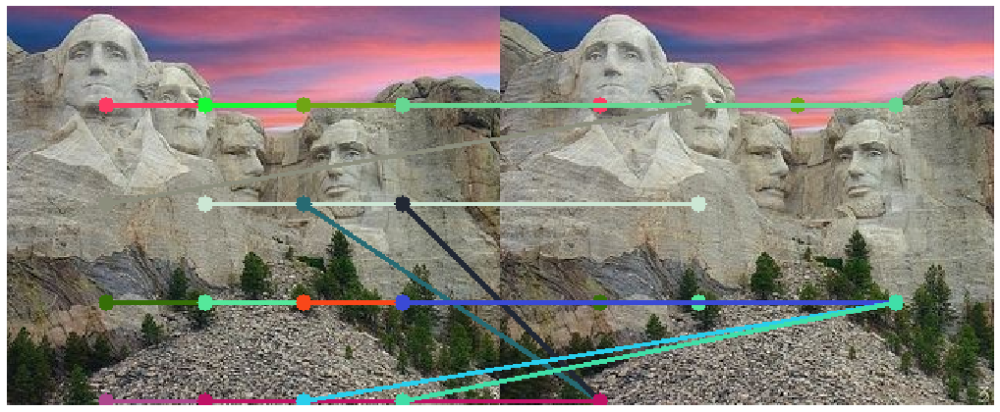

SIFT features Matching


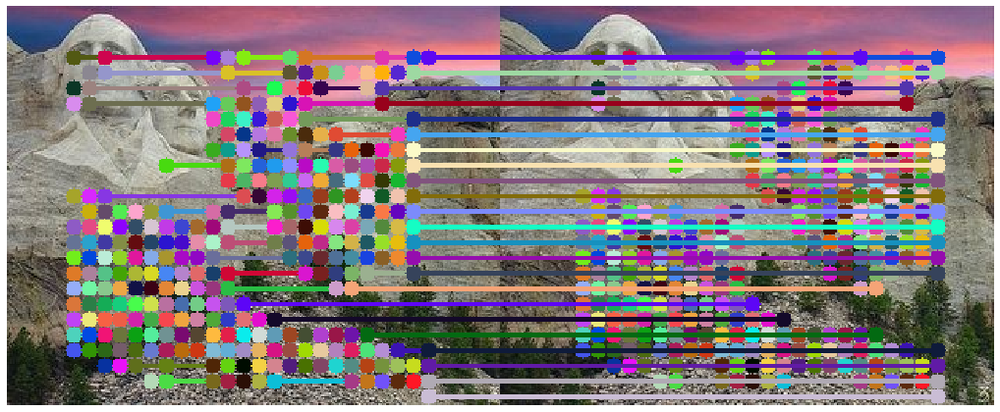

In [118]:
print("Intensity Matching")
img1 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/1_1.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/1_2.jpg'),cv2.COLOR_BGR2RGB)
matches = lin_filter(img1,img2,64,64)
lined_im = draw_matches(img1,img2,matches,64)

print("SIFT features Matching")
img1 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/1_1.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/1_2.jpg'),cv2.COLOR_BGR2RGB)
matches = get_sift_matches_plot(img1,img2)
lined_im = draw_matches(img1,img2,matches,64)

Intensity Matching


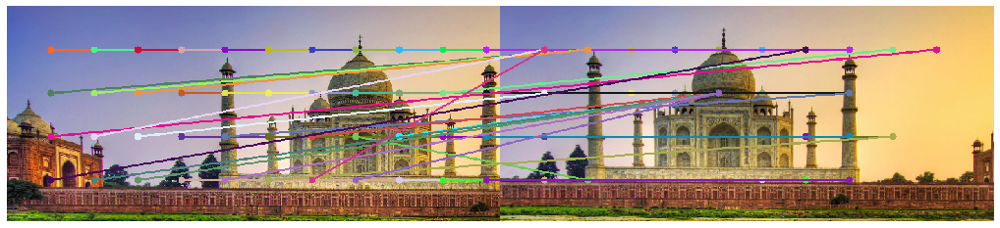

SIFT features Matching


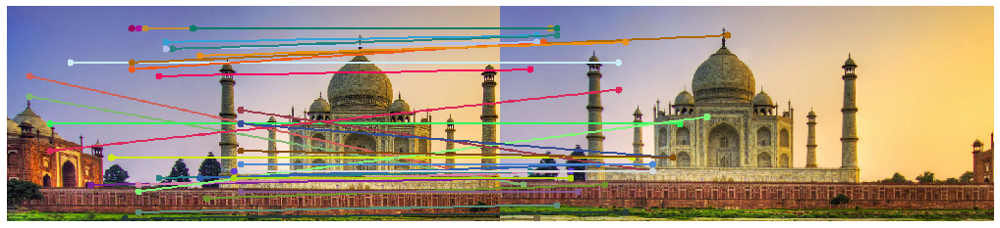

In [124]:
print("Intensity Matching")
img1 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/2_1.png'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/2_2.png'),cv2.COLOR_BGR2RGB)
img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))
matches = lin_filter(img1,img2,64,64)
lined_im = draw_matches(img1,img2,matches,64)

print("SIFT features Matching")
img1 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/2_1.png'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/2_2.png'),cv2.COLOR_BGR2RGB)
img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))
matches = get_sift_matches_plot(img1,img2)
lined_im = draw_matches(img1,img2,matches,64)

Intensity Matching


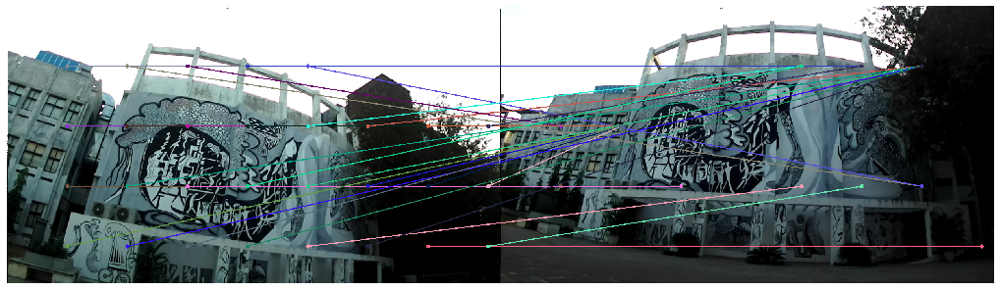

SIFT features Matching


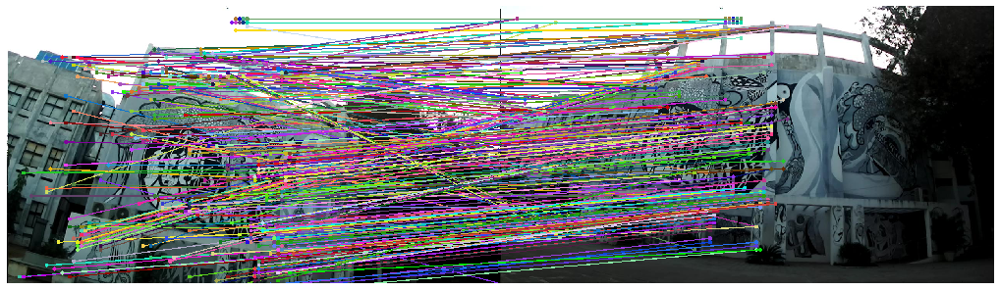

In [131]:
print("Intensity Matching")
img1 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/3_1.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/3_2.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.resize(img2,(img1.shape[1],img1.shape[0]))
matches = lin_filter(img1,img2,156,156)
lined_im = draw_matches(img1,img2,matches,156)

print("SIFT features Matching")
img1 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/3_1.jpg'),cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('../images/StereoCorrespondence/3_2.jpg'),cv2.COLOR_BGR2RGB)
matches = get_sift_matches_plot(img1,img2)
lined_im = draw_matches(img1,img2,matches,64)

In [105]:
import warnings
warnings.filterwarnings('ignore')